In [1]:
!pip install natsort

- Dental segmentation for adults. Many dentists suffer from the difficulty of analyzing panoramic images of teeth for adults. One of the difficulties that dentists suffer from is the difficulty in determining the extension and root of the teeth, which affects the decisions of doctors in many cases that include dental implants, tooth extraction, or other problems. Cases experienced by dentists are difficult.
- In this study, it is proposed to use generative neuronal models in order to study more deeply the fragmentation process of teeth.
- The use of generative networks helps to understand more deeply the shape in which the teeth can be formed, which helps in generalizing on the ability to segment the process, and this leads to models that are more understanding of the morphological structure of the teeth.
- A generative neural network was proposed with the aim of segmenting the dental region of adults, and after completing the process of training the generative network, the generator was retrained only according to the concept of **pixel2pixel** and freezing the weights of a number of layers, in order to make the generator network depend on the training it received from the generative neural network.
- The generative neural network achieved high results in the process of segmentation and tooth recognition, and those results were improved by retraining the generator with freezing a number of layers in order to make the generator able to generalize the results that were reached.
- I was able to reach a stable training process free from overfitting and other problems that could face the training process.
- The number of samples included in the dataset is small, so generative neural networks were used to build a segmentation model that is more generalizable. Within the same panoramic medical images.

# IMPORT PACKAGES

In [3]:
import tensorflow as tf
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2
from keras import layers, models
import pathlib
import natsort
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler

In [4]:
epochs = 10000
batch = 16
eta = 0.001
weight_decay = 6e-8
imageShape = (224, 224, 1)
maskShape = (224, 224, 1)

# READ DATASET (IMAGES, MASKS)

In [60]:
class readDataset:
    def __init__(self, imagesPathes, masksPathes):
        self.imagesPathes = imagesPathes
        self.masksPathes = masksPathes
    def readPathes(self,):
      self.images = natsort.natsorted(list(pathlib.Path(self.imagesPathes).glob('*.*')))
      self.masks = natsort.natsorted(list(pathlib.Path(self.masksPathes).glob('*.*')))
    def readImages(self, data, typeData):
        images = []
        for img in data:
            img = cv2.imread(str(img), 0)
            img = img/255
            img = cv2.resize(img, (224, 224))
            if typeData == 'm':
                img = np.where(img > 0, 1, 0)
            images.append(img)
        return np.array(images)
    def dataAugmentation(self, images, masks):
        imagesupdate = []
        masksupdate = []
        for image, mask in zip(images, masks):
          for aug in range(2):
            imageup = image
            maskup = mask
            if aug == 0:
              imageup = image
              maskup = mask
            else:
              imageup = tf.image.flip_left_right(imageup)
              maskup = tf.image.flip_left_right(maskup)
            imagesupdate.append(imageup), masksupdate.append(maskup)
        return np.array(imagesupdate), np.array(masksupdate)

In [61]:
datasetObject = readDataset('/kaggle/input/childrens-dental-panoramic-radiographs-dataset/Dental_dataset/Adult tooth segmentation dataset/Panoramic radiography database/images',
                            '/kaggle/input/childrens-dental-panoramic-radiographs-dataset/Dental_dataset/Adult tooth segmentation dataset/Panoramic radiography database/mask')
datasetObject.readPathes()

In [62]:
len(datasetObject.images), len(datasetObject.masks)

(598, 598)

In [63]:
images = datasetObject.readImages(datasetObject.images, 'i')
masks = datasetObject.readImages(datasetObject.masks, 'm')
images.shape, masks.shape

((598, 224, 224), (598, 224, 224))

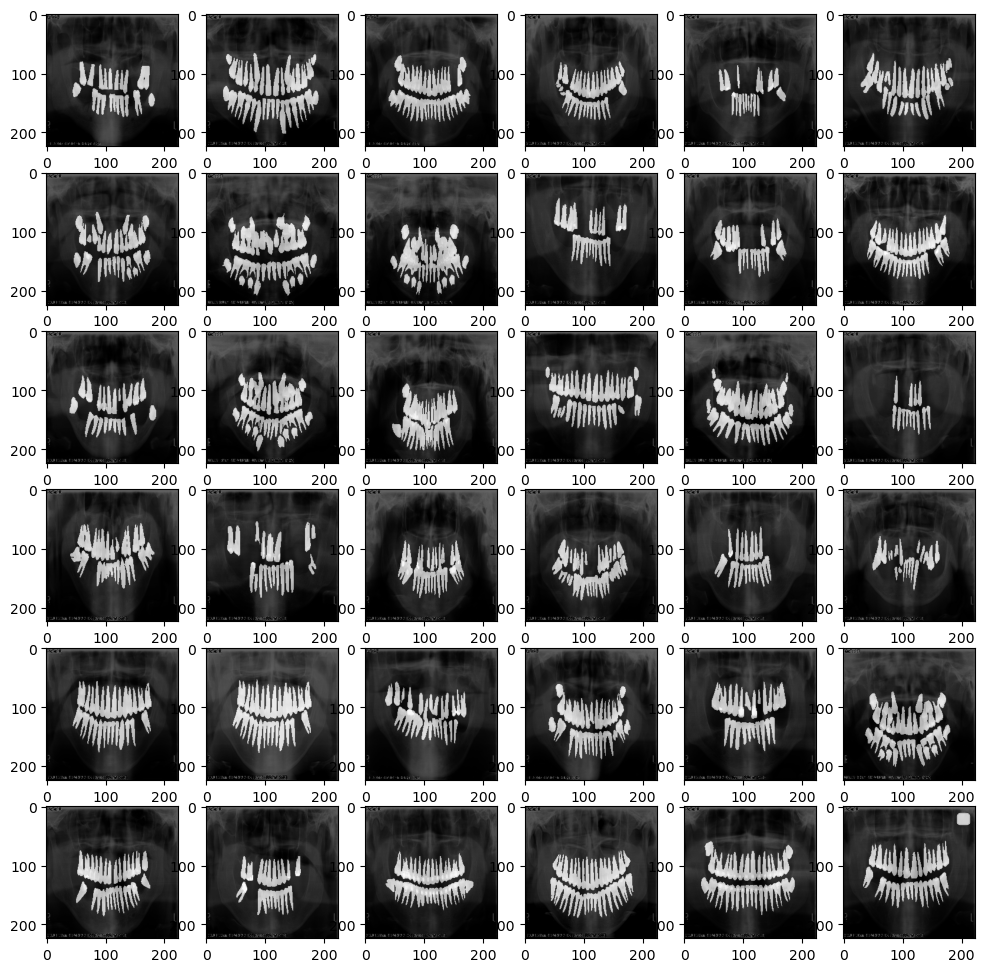

In [9]:
plt.figure(figsize = (12, 12))
for i in range(36):
    plt.subplot(6, 6, (i + 1))
    plt.imshow(images[i], cmap = 'gray')
    plt.imshow(masks[i], alpha = 0.6, cmap = 'gray')
plt.legend()

In [9]:
np.unique(masks), np.min(masks), np.max(masks), np.min(images), np.max(masks)

(array([0, 1]), 0, 1, 0.0, 1)

# An example explaining the proposed methodology

An example to understand the study of the shape of the tooth:
Since I want to move away from the concept of studying pixel2pixel, and I want to study the morphological structure of the teeth and force the neural network to understand more deeply, the structure of the discriminant within the generative neural network includes, in the first layer, the process of applying the mask to the medical image and extracting the dental region only, and thus the discriminant will be studied in This case is the structure and shape of the teeth and their presence close to each other, regardless of the rest of the parts, medical images.

In [54]:
x = layers.Input(shape = (224, 224, 1))
y = layers.Input(shape = (224, 224, 1))
z = layers.multiply([x, y])
m = models.Model(inputs = [x, y], outputs = z)
m.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_23 (InputLayer)          [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 input_24 (InputLayer)          [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 multiply_5 (Multiply)          (None, 224, 224, 1)  0           ['input_23[0][0]',               
                                                                  'input_24[0][0]']           

In [58]:
imagesByMasks = m([images[:64], masks[:64]])
imagesByMasks.shape

TensorShape([64, 224, 224, 1])

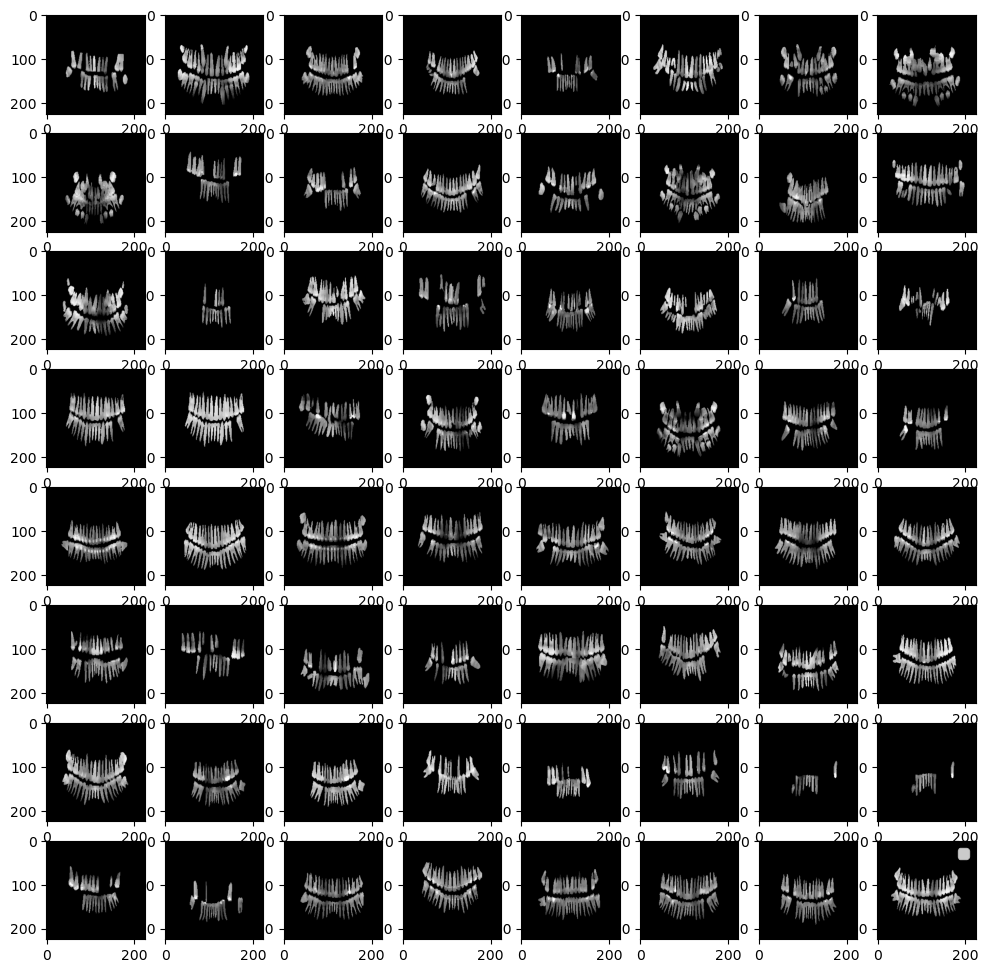

In [59]:
plt.figure(figsize = (12, 12))
for i in range(64):
    plt.subplot(8, 8, (i + 1))
    plt.imshow(imagesByMasks[i], cmap = 'gray')
plt.legend()

In [10]:
i = 80
validImages = images[:i]
validMasks = masks[:i]
trainImages = images[i:]
trainMasks = masks[i:]
validImages.shape, validMasks.shape, trainImages.shape, trainMasks.shape

((80, 224, 224), (80, 224, 224), (518, 224, 224), (518, 224, 224))

# Proposing a generative neural network architecture

In [11]:
def convolution(inputs, filter, padding, strides, kernel, activation, conv_type):
  x = inputs
  x = layers.Conv2D(filter, kernel_size = kernel, padding = padding,
                    strides = strides)(x)
  x = layers.GroupNormalization(groups = filter)(x)
  if conv_type == 'decoder':
      x = layers.Activation(activation)(x)
      x = layers.Conv2D(filter*2, kernel_size = kernel, padding = padding, strides = strides)(x)
      x = layers.GroupNormalization(groups = filter*2)(x)
      x = layers.Activation(activation)(x)
      x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides)(x)
      x = layers.GroupNormalization(groups = filter)(x)
  x = layers.average([x, layers.Conv2D(filter, kernel_size = 1, padding = 'same',
                                      strides = 1)(inputs)])
  x = layers.Activation(activation)(x)
  return x

In [12]:
def encoder(input, filter, padding, strides, kernel, activation):
  x = input
  x = convolution(x, filter, padding, strides, kernel, activation, 'encoder')
  downsample = layers.AveragePooling2D()(x)
  return downsample, x

In [13]:
def decoder(input, filter, skip, padding, strides, kernel, activation):
  x = input
  x = layers.Conv2DTranspose(filter, kernel_size = kernel, padding = padding,
                             strides = 2, activation = activation)(x)
  x = layers.average([x, skip])
  x = convolution(x, filter, padding, strides, kernel, activation, 'decoder')
  return x

In [14]:
def generator(input, filter, padding, strides, kernel, weights):
  x = input
  con1, skip1 = encoder(x, filter, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con2, skip2 = encoder(con1, filter*2, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con3, skip3 = encoder(con2, filter*4, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con4, skip4 = encoder(con3, filter*8, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con5, skip5 = encoder(con4, filter*16, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  deco = decoder(con5, filter*16, skip5, padding = padding, strides = strides,
                  kernel = kernel, activation = 'relu')
  deco1 = decoder(deco, filter*8, skip4, padding = padding, strides = strides,
                  kernel = kernel, activation = 'relu')
  deco2 = decoder(deco1, filter*4, skip3, padding = padding, strides = strides,
                  kernel = kernel, activation = 'relu')
  deco3 = decoder(deco2, filter*2, skip2, padding = padding, strides = strides,
                  kernel = kernel, activation = 'relu')
  deco4 = decoder(deco3, filter, skip1, padding = padding, strides = strides,
                  kernel = kernel, activation = 'relu')
  output = layers.Conv2DTranspose(1, kernel_size = kernel, strides = strides,
                                  padding = padding, activation = 'sigmoid')(deco4)
  generator = models.Model(inputs = input, outputs = output, name = 'generator')
  if weights != None:
    generator.load_weights('/kaggle/working/mask_generator.h5')
  generator.summary()
  return generator

In [16]:
G = generator(input = layers.Input(shape = (224, 224, 1)), filter = 32,
              padding = 'same', kernel = 3, strides = 1, weights = None)

Model: "generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 224, 224, 32  320         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 group_normalization (GroupNorm  (None, 224, 224, 32  64         ['conv2d[0][0]']                 
 alization)                     )                                                         

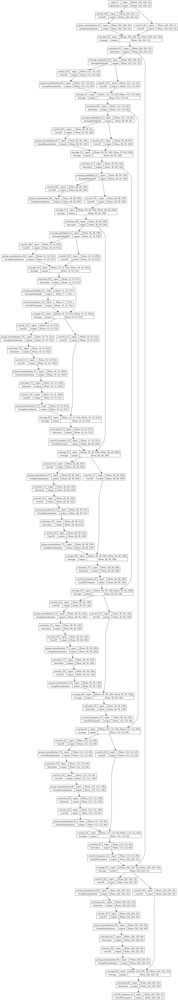

In [52]:
tf.keras.utils.plot_model(G, show_shapes = True)

In [15]:
def discriminator(ImageInput, maskInput, filter, padding, strides, kernel, weights,
                  lossFn, learning_rate, weight_decay):
  x = layers.multiply([ImageInput, maskInput])
  con1, skip1 = encoder(x, filter, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con2, skip2 = encoder(con1, filter*2, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con3, skip3 = encoder(con2, filter*4, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con4, skip4 = encoder(con3, filter*8, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con5, skip5 = encoder(con4, filter*16, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  x = layers.GlobalAveragePooling2D()(con5)
  x = layers.Dropout(0.1)(x)
  x = layers.Dense(1)(x)
  discriminator = models.Model(inputs = [maskInput, ImageInput], outputs = x,
                              name = 'discriminator')
  if weights != None:
    discriminator.load_weights('/kaggle/working/discriminator.h5')
  discriminator.compile(loss = lossFn, optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                                              weight_decay = weight_decay))
  discriminator.summary()
  return discriminator

In [50]:
D = discriminator(ImageInput = layers.Input(shape = imageShape), maskInput = layers.Input(shape = maskShape),
                  filter = 32, padding = 'same', strides = 1, kernel = 3, weights = None,
                  lossFn = 'mse', learning_rate = eta, weight_decay = weight_decay)

Model: "discriminator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_21 (InputLayer)          [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 input_22 (InputLayer)          [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 multiply_3 (Multiply)          (None, 224, 224, 1)  0           ['input_21[0][0]',               
                                                                  'input_22[0][0]']   

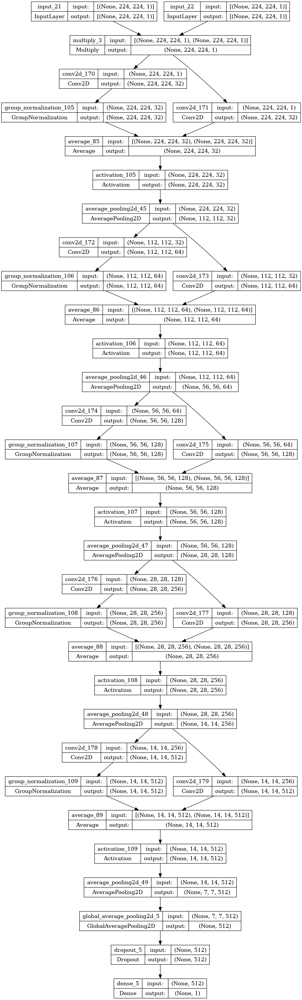

In [51]:
tf.keras.utils.plot_model(D, show_shapes = True)

In [20]:
def GAN(discriminator, generator, imageInput, maskInput, learning_rate, weight_decay,
                   lossFn):
  discriminator.trainable = False
  gan = models.Model(
      inputs = [imageInput],
      outputs = discriminator([generator(imageInput), imageInput],),
      name = 'gan'
  )
  gan.compile(loss = lossFn, optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate*0.5,
                                                                              weight_decay = weight_decay*0.5))
  gan.summary()
  return gan

In [20]:
gan = GAN(discriminator = D, generator = G, imageInput = layers.Input(shape = imageShape),
          maskInput = layers.Input(shape = maskShape), learning_rate = eta, weight_decay = weight_decay,
                   lossFn = 'mse')

Model: "gan"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 generator (Functional)         (None, 224, 224, 1)  21747745    ['input_4[0][0]']                
                                                                                                  
 discriminator (Functional)     (None, 1)            1745601     ['generator[0][0]',              
                                                                  'input_4[0][0]']                
                                                                                                

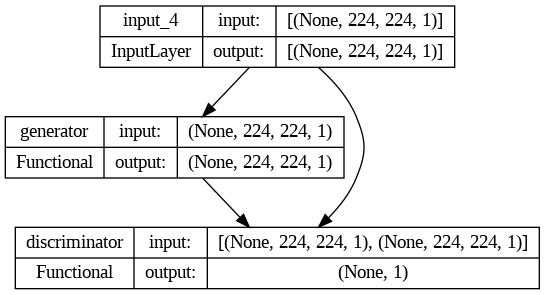

In [23]:
tf.keras.utils.plot_model(gan, show_shapes = True)

In [16]:
def samples(generator, images, realMasks):
  masks = tf.squeeze(generator.predict(images))
  all = np.vstack([realMasks, masks])
  plt.figure(figsize = (12, 4))
  for i in range(16):
    plt.subplot(2, 8, (i + 1))
    plt.imshow(all[i], cmap = 'gray')
  plt.show()

- In the beginning, the generative neural network will find it difficult to understand exactly what is required of it, but with time, the generative network will realize that it has to generate a mask so that if it is applied to the panoramic image, we will extract areas of the teeth with the same characteristics and specifications that the distinguished one studied.
- The main idea is to make the hashing task not easy and requires awareness on the part of the generator of what it should generate, since I did not tell it exactly what it should generate, but rather I left it to him to realize what he should generate.
- As I mentioned, with time the generator will understand the idea and therefore will work on generating the mask without being asked to do so openly.

Epoch/Epochs: 0/10000
discriminator loss: [tag: 0.5826840400695801,], generator loss: [tag: 0.14781439304351807,]
1/1 [==============================] - 3s 3s/step


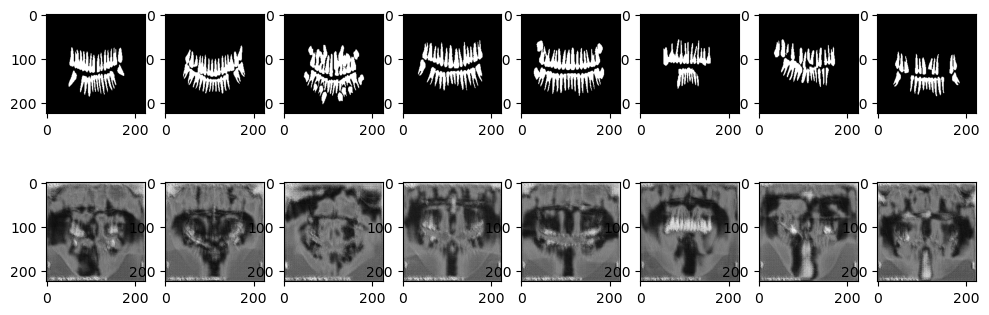

Epoch/Epochs: 500/10000
discriminator loss: [tag: 0.2311585545539856,], generator loss: [tag: 0.22412176430225372,]
1/1 [==============================] - 0s 25ms/step


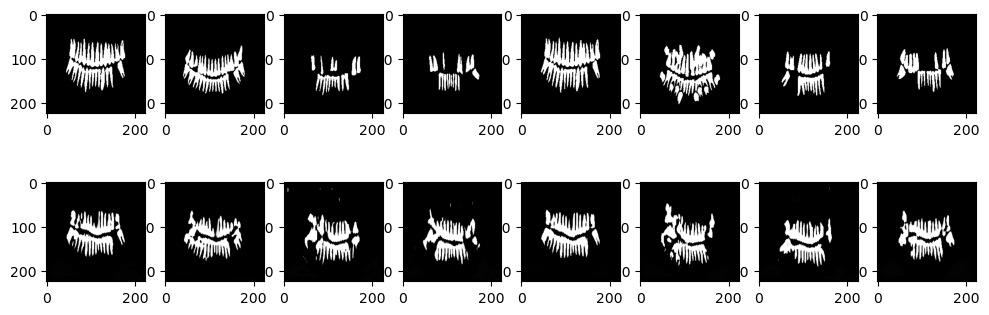

Epoch/Epochs: 1000/10000
discriminator loss: [tag: 0.22187305986881256,], generator loss: [tag: 0.19996128976345062,]
1/1 [==============================] - 0s 26ms/step


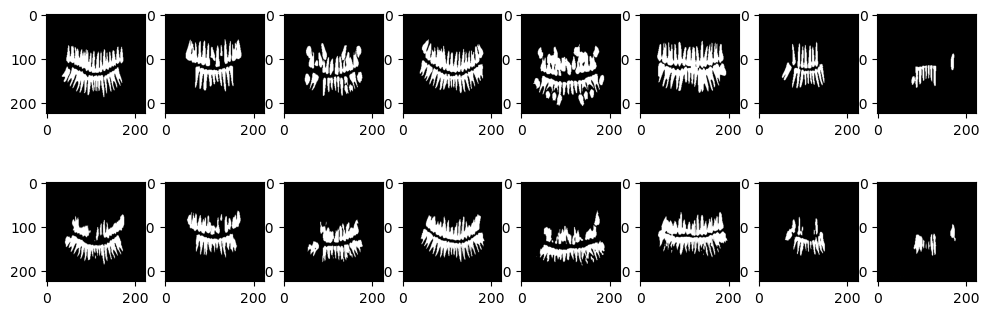

Epoch/Epochs: 1500/10000
discriminator loss: [tag: 0.21904641389846802,], generator loss: [tag: 0.19440039992332458,]
1/1 [==============================] - 0s 27ms/step


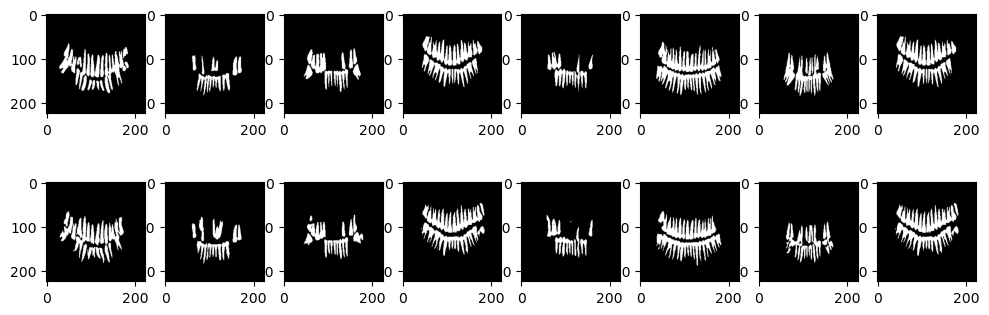

Epoch/Epochs: 2000/10000
discriminator loss: [tag: 0.20590327680110931,], generator loss: [tag: 0.4468284845352173,]
1/1 [==============================] - 0s 28ms/step


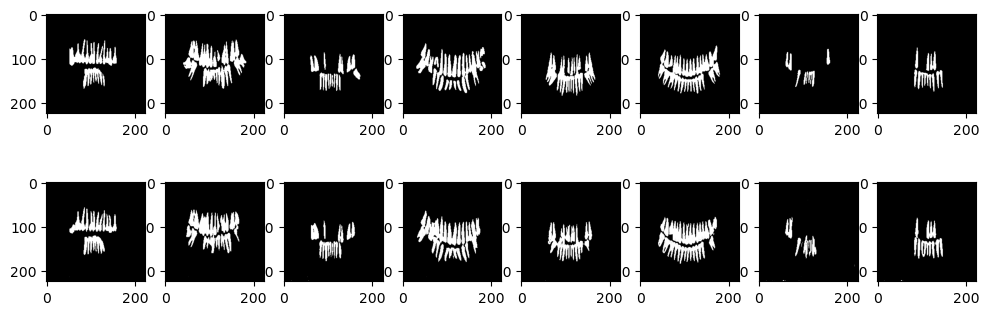

Epoch/Epochs: 2500/10000
discriminator loss: [tag: 0.22413161396980286,], generator loss: [tag: 0.24899813532829285,]
1/1 [==============================] - 0s 24ms/step


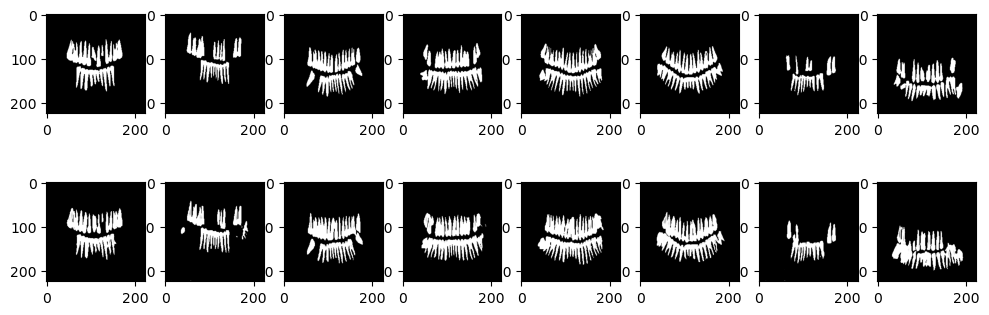

Epoch/Epochs: 3000/10000
discriminator loss: [tag: 0.21763376891613007,], generator loss: [tag: 0.4433063864707947,]
1/1 [==============================] - 0s 23ms/step


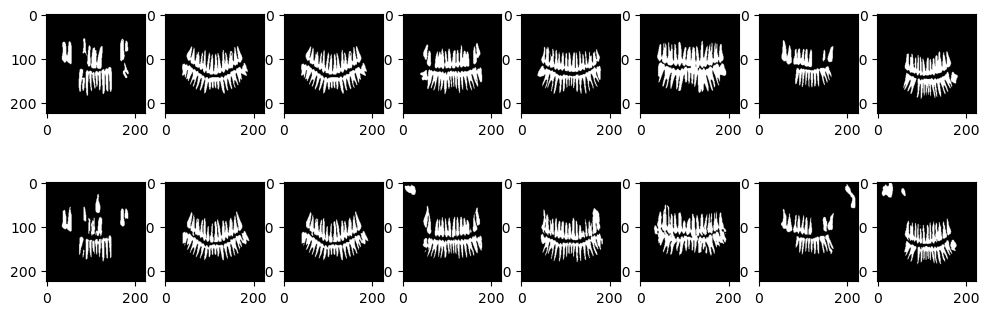

Epoch/Epochs: 3500/10000
discriminator loss: [tag: 0.21998810768127441,], generator loss: [tag: 0.5424106121063232,]
1/1 [==============================] - 0s 24ms/step


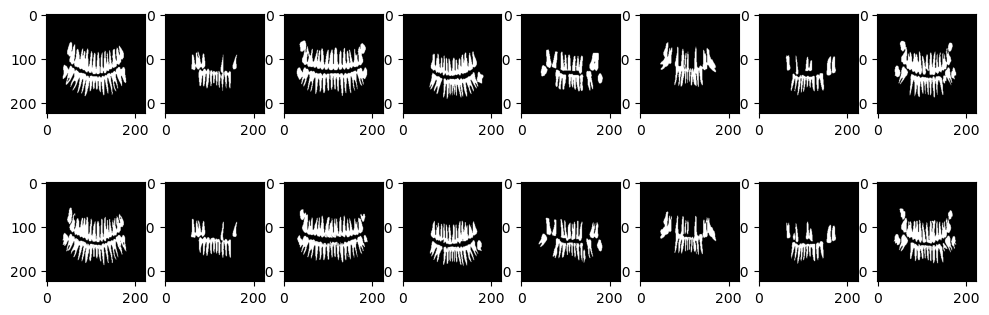

Epoch/Epochs: 4000/10000
discriminator loss: [tag: 0.1752854287624359,], generator loss: [tag: 0.704730212688446,]
1/1 [==============================] - 0s 24ms/step


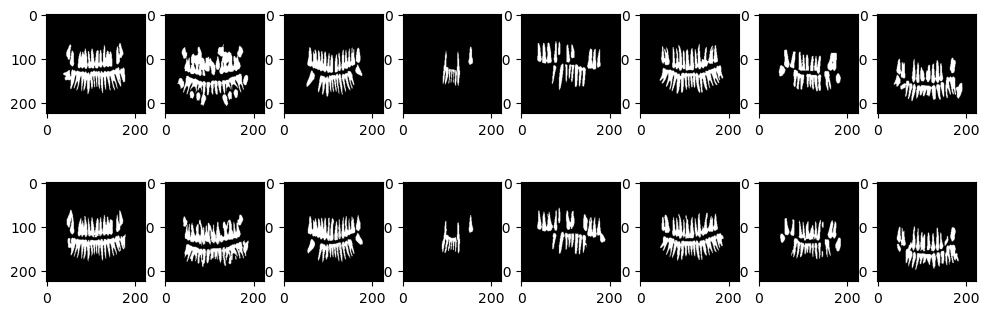

Epoch/Epochs: 4500/10000
discriminator loss: [tag: 0.1792781800031662,], generator loss: [tag: 0.5332086086273193,]
1/1 [==============================] - 0s 24ms/step


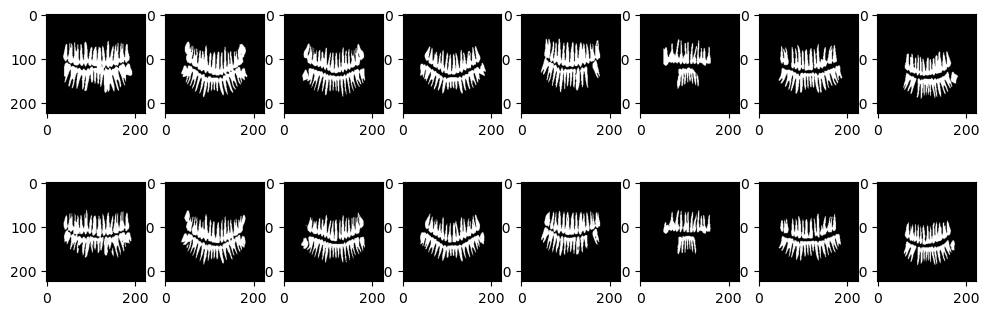

Epoch/Epochs: 5000/10000
discriminator loss: [tag: 0.1756303757429123,], generator loss: [tag: 0.32726192474365234,]
1/1 [==============================] - 0s 24ms/step


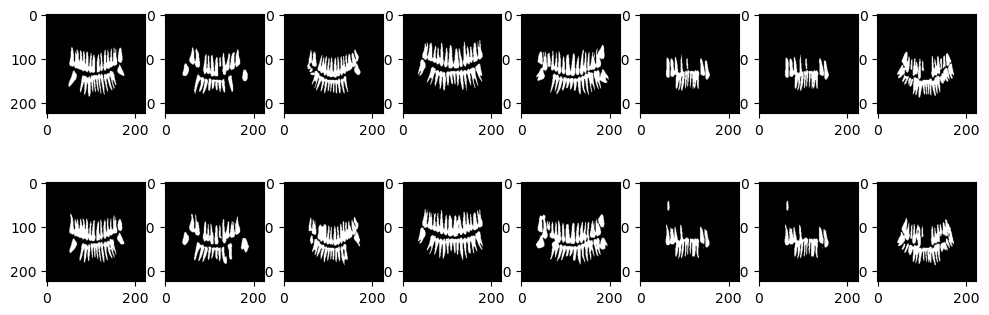

Epoch/Epochs: 5500/10000
discriminator loss: [tag: 0.1300555318593979,], generator loss: [tag: 0.4199977219104767,]
1/1 [==============================] - 0s 23ms/step


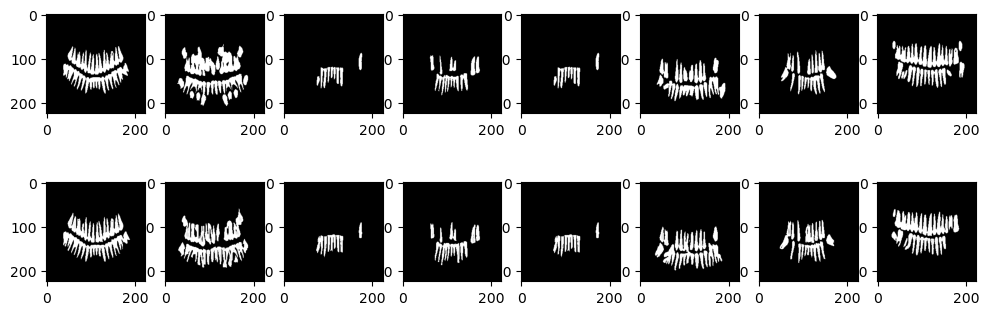

Epoch/Epochs: 6000/10000
discriminator loss: [tag: 0.09639821201562881,], generator loss: [tag: 0.5292875170707703,]
1/1 [==============================] - 0s 24ms/step


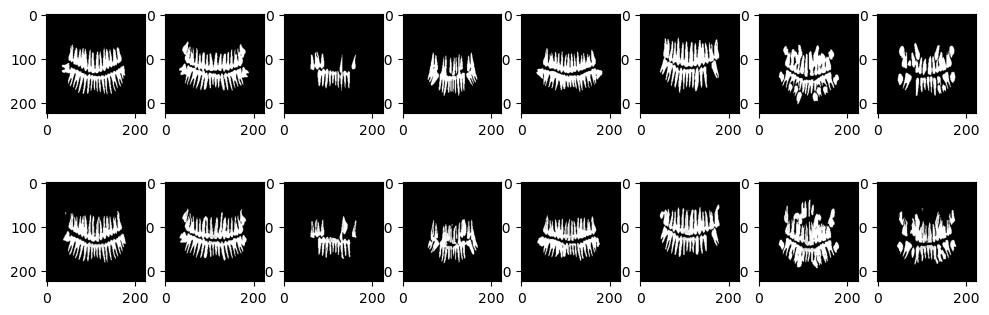

Epoch/Epochs: 6500/10000
discriminator loss: [tag: 0.12680555880069733,], generator loss: [tag: 0.24017596244812012,]
1/1 [==============================] - 0s 23ms/step


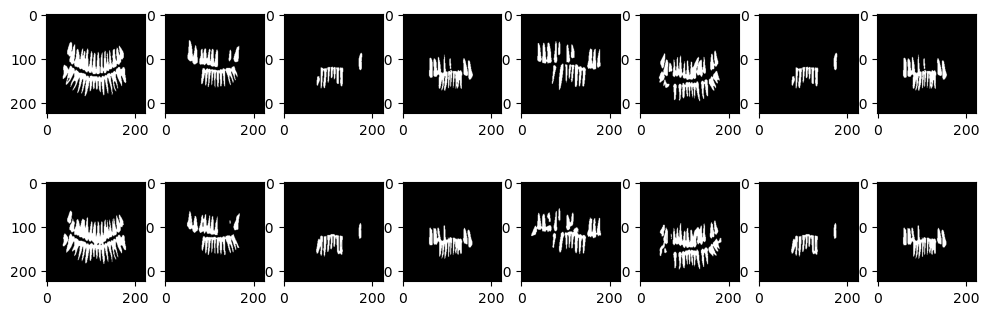

Epoch/Epochs: 7000/10000
discriminator loss: [tag: 0.19281819462776184,], generator loss: [tag: 0.24298851191997528,]
1/1 [==============================] - 0s 25ms/step


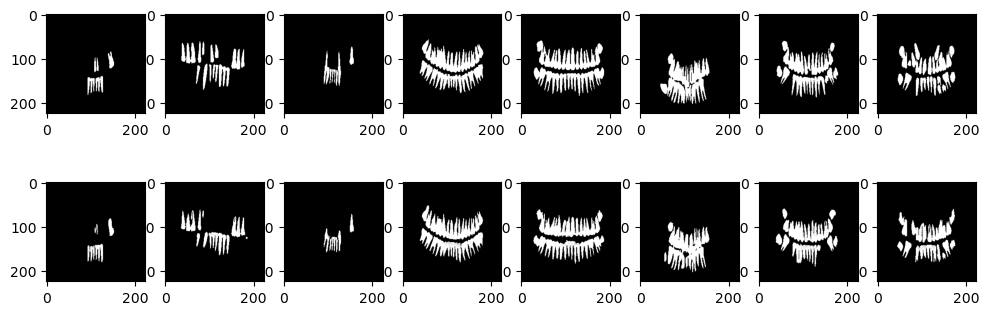

Epoch/Epochs: 7500/10000
discriminator loss: [tag: 0.09712056070566177,], generator loss: [tag: 0.36266371607780457,]
1/1 [==============================] - 0s 28ms/step


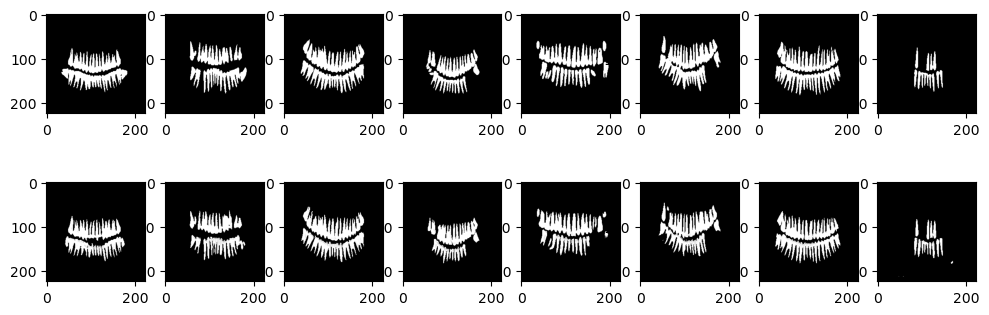

Epoch/Epochs: 8000/10000
discriminator loss: [tag: 0.16246026754379272,], generator loss: [tag: 0.1568450927734375,]
1/1 [==============================] - 0s 24ms/step


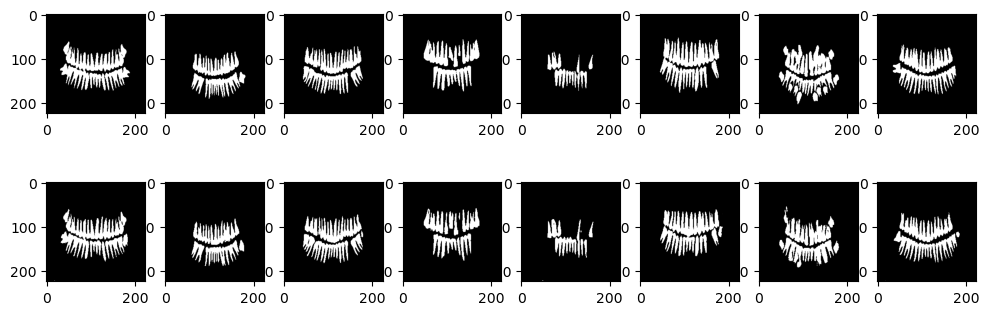

Epoch/Epochs: 8500/10000
discriminator loss: [tag: 0.1428910195827484,], generator loss: [tag: 0.22568359971046448,]
1/1 [==============================] - 0s 25ms/step


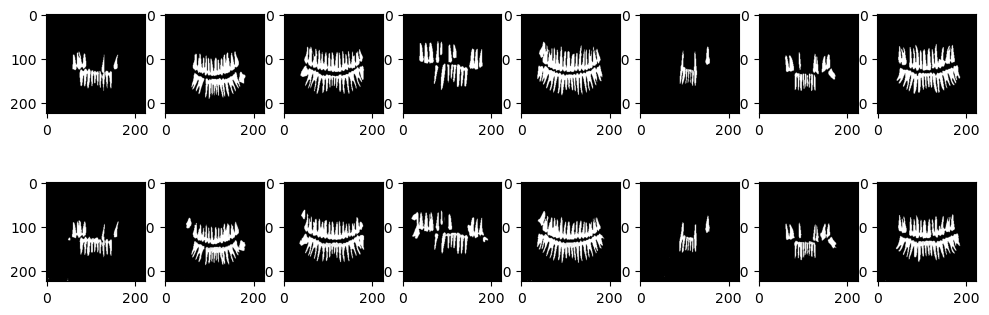

Epoch/Epochs: 9000/10000
discriminator loss: [tag: 0.0800735205411911,], generator loss: [tag: 0.799485981464386,]
1/1 [==============================] - 0s 24ms/step


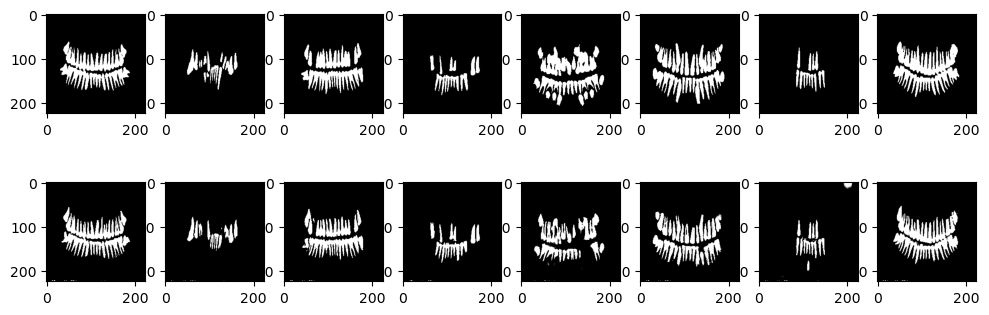

Epoch/Epochs: 9500/10000
discriminator loss: [tag: 0.2307877242565155,], generator loss: [tag: 0.11523553729057312,]
1/1 [==============================] - 0s 24ms/step


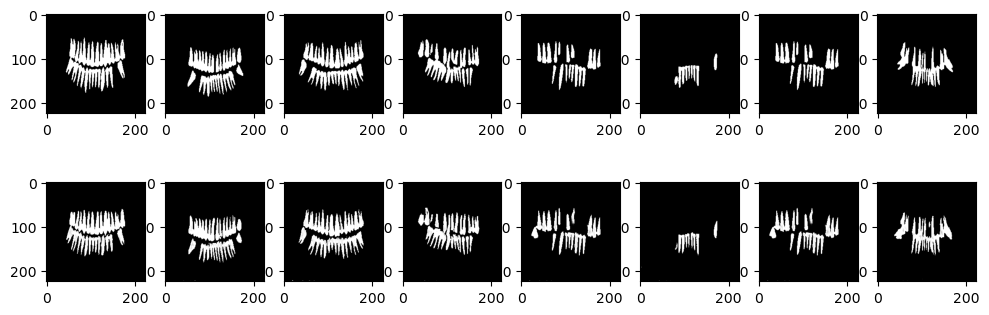

In [22]:
for epoch in range(epochs):
    indexs = np.random.randint(0, len(trainImages), size = (batch, ))
    realImages = trainImages[indexs]
    realMasks = trainMasks[indexs]
    realTag = tf.ones(shape = (batch, ))
    fakeMasks = tf.squeeze(G.predict([realImages], verbose = 0))
    fakeTag = tf.zeros(shape = (batch, ))
    allMasks = np.vstack([realMasks, fakeMasks])
    allTags = np.hstack([realTag, fakeTag])
    allImages = np.vstack([realImages, realImages])
    dlossTag = D.train_on_batch([allMasks, allImages], [allTags])
    glossTag = gan.train_on_batch([realImages], [realTag,])
    if epoch % 500 == 0:
        print('Epoch/Epochs: {}/{}'.format(epoch, epochs))
        print('discriminator loss: [tag: {},], generator loss: [tag: {},]'.format(dlossTag, glossTag))
        validIndexs = np.random.randint(0, len(validImages), size = (8, ))
        samples(G, validImages[validIndexs], validMasks[validIndexs])

In [23]:
G.save_weights('/kaggle/working/mask_generator.h5')
D.save_weights('/kaggle/working/mask_discriminator.h5')

- Now we will train the generator again with a number of layers frozen in order to maintain the capacity that the generator has gained.

In [32]:
G = generator(input = layers.Input(shape = (224, 224, 1)), filter = 32,
              padding = 'same', kernel = 3, strides = 1, weights = True)
for layer in G.layers[:20]:
  layer.trainable = False
G.compile(loss = tf.keras.losses.BinaryFocalCrossentropy(),
                  optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001),
                  metrics = ['accuracy', tf.keras.metrics.Precision(name = 'precision'),
                             tf.keras.metrics.Recall(name = 'recall')])
G.summary()

Model: "generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_100 (Conv2D)            (None, 224, 224, 32  320         ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 group_normalization_65 (GroupN  (None, 224, 224, 32  64         ['conv2d_100[0][0]']             
 ormalization)                  )                                                         

# Evaluation of training performance using generative neural networks on both training and test data

In [27]:
G.evaluate(validImages, validMasks)

3/3 [==============================] - 7s 159ms/step - loss: 0.2661 - accuracy: 0.9795 - precision: 0.9129 - recall: 0.9072


[0.266131728887558, 0.979521632194519, 0.9128776788711548, 0.9072290062904358]

In [28]:
G.evaluate(trainImages, trainMasks)

17/17 [==============================] - 4s 264ms/step - loss: 0.2522 - accuracy: 0.9805 - precision: 0.9093 - recall: 0.9228


[0.2521543502807617,
 0.9805471897125244,
 0.9093438386917114,
 0.9227907061576843]

# Re-training of the generator according to the pixel2pixel methodology

In [33]:
history = G.fit(trainImages, trainMasks, epochs = 160, batch_size = 8,
                        validation_data = (validImages, validMasks), callbacks = [
                            tf.keras.callbacks.EarlyStopping(patience = 5, monitor = 'val_loss',
                                                             mode = 'min',
                                                             restore_best_weights = True)
                        ])

Epoch 1/160
65/65 [==============================] - 37s 207ms/step - loss: 0.2276 - accuracy: 0.9817 - precision: 0.9204 - recall: 0.9208 - val_loss: 0.2212 - val_accuracy: 0.9812 - val_precision: 0.9291 - val_recall: 0.9042
Epoch 2/160
65/65 [==============================] - 10s 160ms/step - loss: 0.1783 - accuracy: 0.9822 - precision: 0.9253 - recall: 0.9194 - val_loss: 0.1575 - val_accuracy: 0.9805 - val_precision: 0.9233 - val_recall: 0.9040
Epoch 3/160
65/65 [==============================] - 10s 159ms/step - loss: 0.1144 - accuracy: 0.9805 - precision: 0.9099 - recall: 0.9219 - val_loss: 0.0951 - val_accuracy: 0.9784 - val_precision: 0.8977 - val_recall: 0.9150
Epoch 4/160
65/65 [==============================] - 10s 158ms/step - loss: 0.0678 - accuracy: 0.9778 - precision: 0.8815 - recall: 0.9320 - val_loss: 0.0586 - val_accuracy: 0.9758 - val_precision: 0.8678 - val_recall: 0.9299
Epoch 5/160
65/65 [==============================] - 10s 159ms/step - loss: 0.0434 - accuracy: 0

# The results obtained

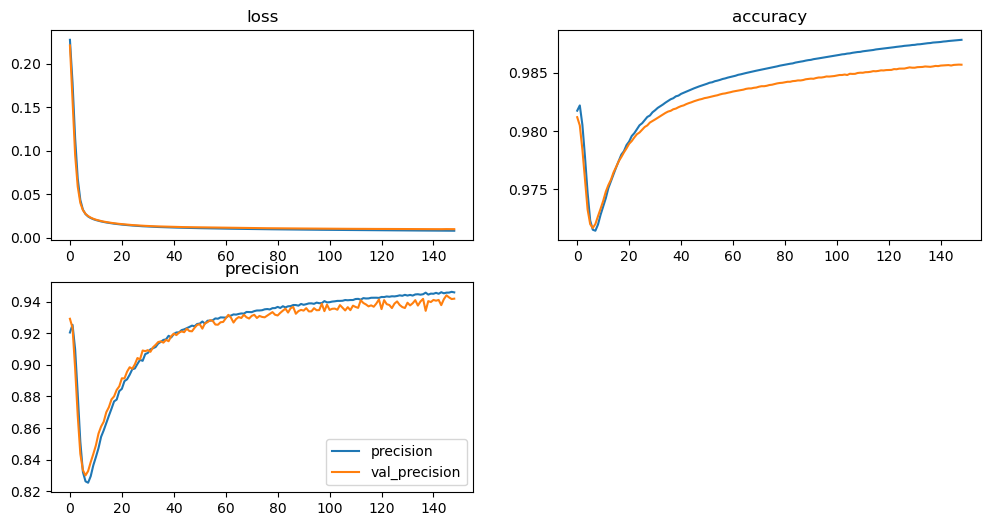

In [42]:
metrics = ['loss','accuracy', 'precision']
plt.figure(figsize = (12, 6))
for i in range(3):
    plt.subplot(2, 2, (i + 1))
    plt.plot(history.history['{}'.format(metrics[i])], label = '{}'.format(metrics[i]))
    plt.plot(history.history['val_{}'.format(metrics[i])], label = 'val_{}'.format(metrics[i]))
    plt.title('{}'.format(metrics[i]))
plt.legend()

In [35]:
G.evaluate(validImages, validMasks)

3/3 [==============================] - 2s 159ms/step - loss: 0.0096 - accuracy: 0.9857 - precision: 0.9377 - recall: 0.9365


[0.009645750746130943,
 0.9856500029563904,
 0.937725305557251,
 0.9365140795707703]

In [36]:
G.evaluate(trainImages, trainMasks)

17/17 [==============================] - 3s 193ms/step - loss: 0.0079 - accuracy: 0.9877 - precision: 0.9435 - recall: 0.9501


[0.0079295439645648,
 0.9877181649208069,
 0.9434637427330017,
 0.9501035213470459]

In [43]:
G.save('/kaggle/working/final_tooth_mask_generation.h5')

In [42]:
G = tf.keras.models.load_model('/kaggle/working/final_tooth_mask_generation.h5')

In [37]:
masks_pred = G.predict(validImages)
masks_pred = (masks_pred >= 0.5).astype('int')

3/3 [==============================] - 2s 189ms/step


In [38]:
masks_pred.shape

(80, 224, 224, 1)

In [46]:
def draw(images, masks, y_pred):
  plt.figure(figsize = (12, 50))
  index = -1
  n = np.random.randint(y_pred.shape[0])
  for i in range(120):
    plt.subplot(20, 6, (i + 1))
    if index == -1:
      plt.imshow(images[n], cmap = 'gray')
      plt.title('Image')
      index = 0
    elif index == 0:
      plt.imshow(images[n], cmap = 'gray')
      plt.imshow(masks[n], alpha = 0.6, cmap = 'gray')
      plt.title('Original Mask')
      index = 1
    elif index == 1:
      plt.imshow(images[n], cmap = 'gray')
      plt.imshow(np.reshape(y_pred[n], (224, 224)), alpha = 0.6, cmap = 'gray')
      plt.title('Predict Mask')
      index = -1
      n = np.random.randint(y_pred.shape[0])
  plt.legend()

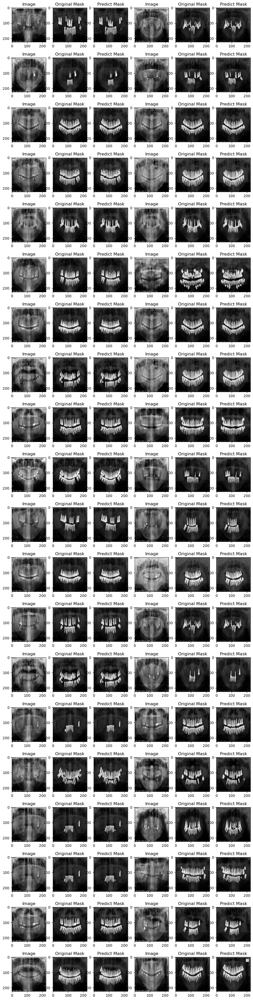

In [40]:
draw(validImages, validMasks, masks_pred)

In [43]:
masks_pred = G.predict(trainImages)
masks_pred = (masks_pred >= 0.5).astype('int')

17/17 [==============================] - 10s 256ms/step


In [44]:
masks_pred.shape

(518, 224, 224, 1)

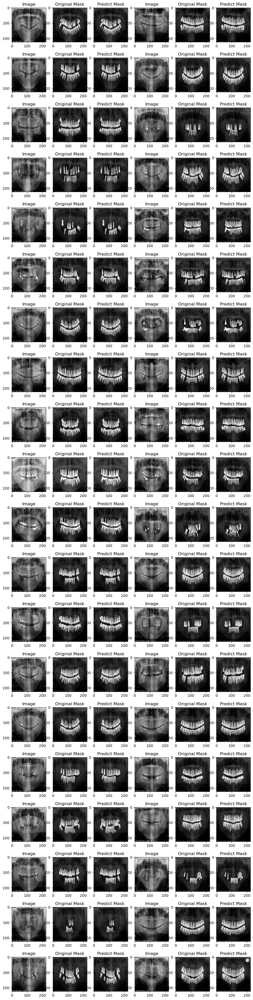

In [47]:
draw(trainImages, trainMasks, masks_pred)

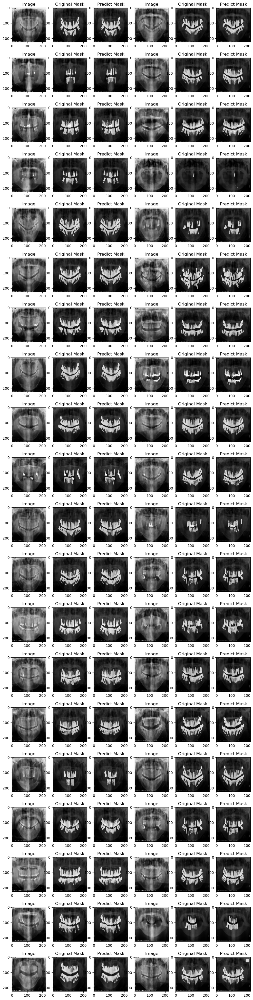

In [48]:
draw(trainImages, trainMasks, masks_pred)